In [2]:
import os
import time
import pickle
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from scipy.spatial.transform import Rotation as Rot
from scipy.optimize import least_squares
from lightglue import LightGlue, ALIKED

Device: cpu
Loaded 4 crop images
Detecting keypoints
Keypoints: 4096 detected


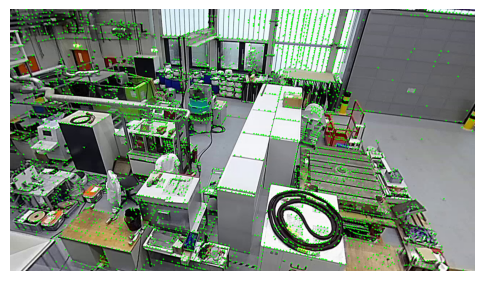

Keypoints: 4096 detected


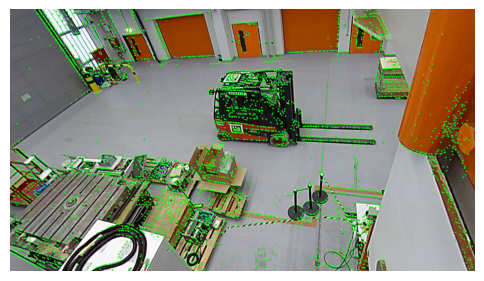

Keypoints: 4096 detected


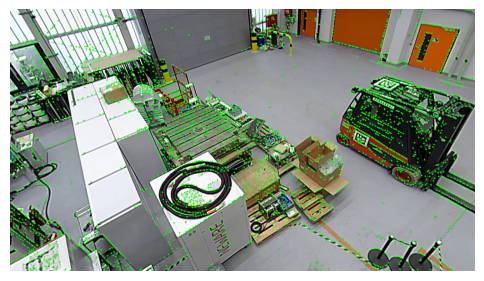

Keypoints: 4096 detected


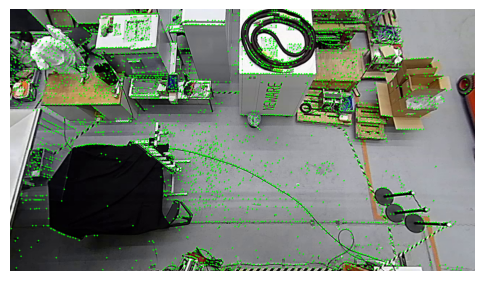

 Matching pairs
 Pair 0-1: 29 matches (mean conf 0.400)


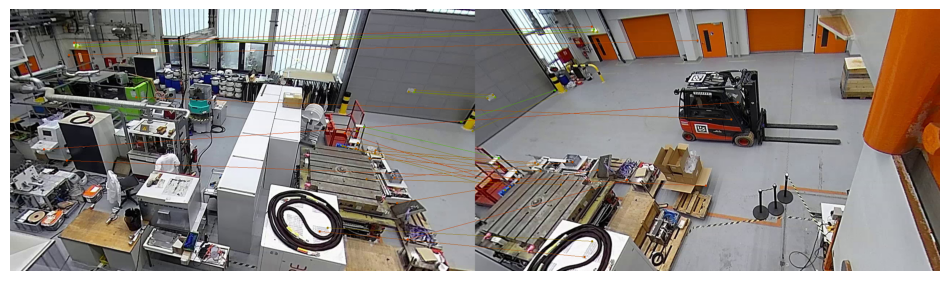

 Pair 0-2: 1286 matches (mean conf 0.834)


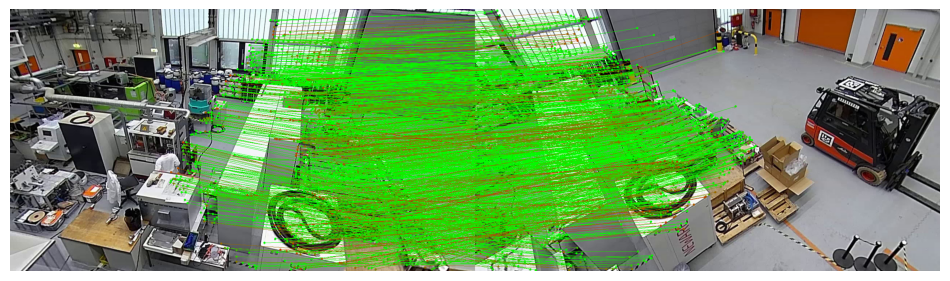

 Pair 0-3: 1086 matches (mean conf 0.849)


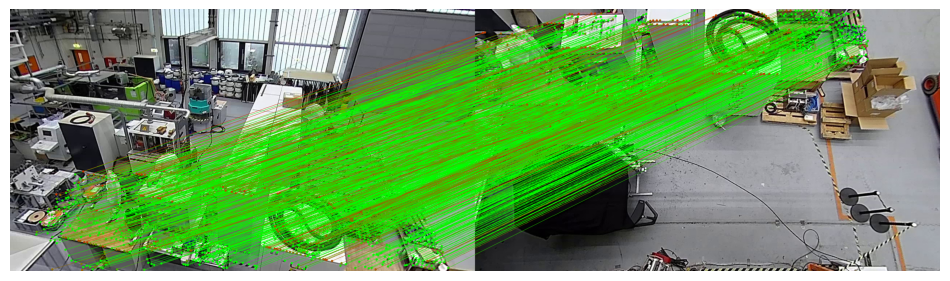

 Pair 1-2: 1598 matches (mean conf 0.834)


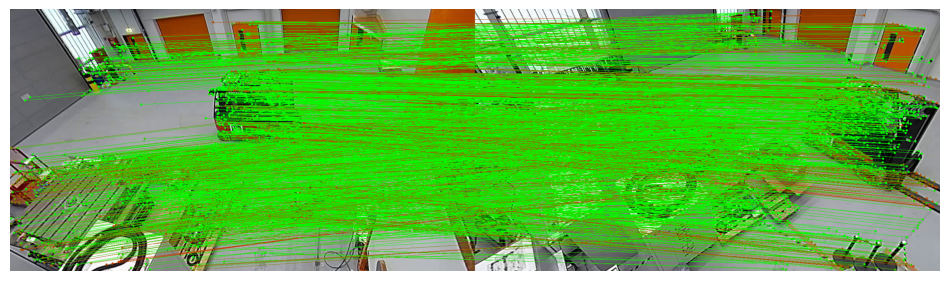

 Pair 1-3: 12 matches (mean conf 0.264)


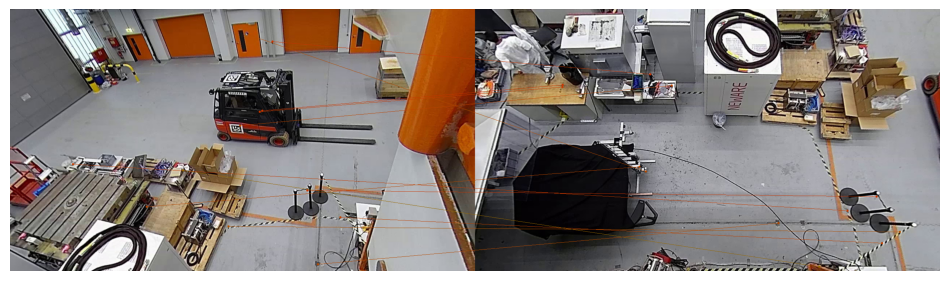

 Pair 2-3: 835 matches (mean conf 0.827)


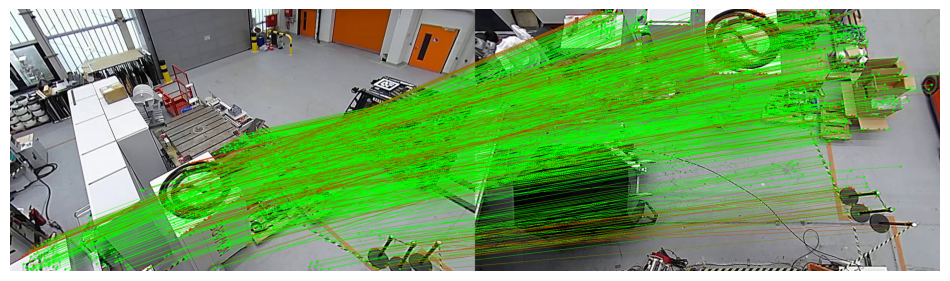

In [6]:

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Device: {device}")

views_path = [
    "ohlf_fisheye/cam_233_view1.jpg",
    "ohlf_fisheye/cam_233_view2.jpg",
    "ohlf_fisheye/cam_233_view3.jpg",
    "ohlf_fisheye/cam_233_view4.jpg"
]

fisheye_path = "20251028_164444 (1).png"



def load_images(views, fisheye_path=None):
    image_bgr = []
    image_rgb = []
    for p in views:
        b = cv2.imread(p)
        if b is None:
            raise FileNotFoundError(f"Missing {p}")
        image_bgr.append(b)
        image_rgb.append(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))
    fisheye_img = None
    if fisheye_path:
        fb = cv2.imread(fisheye_path)
        if fb is None:
            raise FileNotFoundError(f"Missing fisheye image {fisheye_path}")
        fisheye_img = cv2.cvtColor(fb, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        fisheye_img_ = fb
    return image_bgr, image_rgb, fisheye_img, fisheye_img_

image_bgr, image_rgb, fisheye_img, fisheye_img_ = load_images(views_path, fisheye_path)
image_bgr_ = image_bgr
n_crops = len(image_rgb)
print(f"Loaded {n_crops} crop images")


aliked = ALIKED(max_num_keypoints=4096, detection_threshold=0.002).eval().to(device)
matcher = LightGlue(features='aliked', filter_threshold=0.07, width_confidence=0.99, depth_confidence=0.95).eval().to(device)

images_t = []
for rgb in image_rgb:
    t = torch.from_numpy(rgb).permute(2,0,1).float() / 255.0
    images_t.append(t.unsqueeze(0).to(device))

features = []
print("Detecting keypoints")
with torch.no_grad():
    for i, img in enumerate(images_t):
        feat = aliked({'image': img})
        for k in ['keypoints','descriptors']:
            if feat[k].ndim == 2:
                feat[k] = feat[k].unsqueeze(0)
        features.append(feat)
        img_disp = (img[0].permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8).copy()
        for (x, y) in feat['keypoints'][0].cpu().numpy().astype(int):
            cv2.circle(img_disp, (x, y), 2, (0, 255, 0), -1)
        print(f"Keypoints: {feat['keypoints'].shape[1]} detected")
        plt.figure(figsize=(6, 4))
        plt.imshow(img_disp)
        plt.axis('off')
        plt.show()


matches_dict = {}
print(" Matching pairs")
with torch.no_grad():
    for i in range(n_crops):
        for j in range(i+1, n_crops):
            pred = matcher({'image0': features[i], 'image1': features[j]})
            matches0 = pred['matches0'][0].cpu().numpy()
            confidences = pred.get('matching_scores0', None)
            conf = confidences[0].cpu().numpy() if confidences is not None else np.zeros_like(matches0)
            valid = (matches0 > -1) & (conf > 0.2)
            mconf = conf[valid]
            mk0 = features[i]['keypoints'][0].cpu().numpy()[valid]
            mk1 = features[j]['keypoints'][0].cpu().numpy()[matches0[valid]]
            matches_dict[(i,j)] = (mk0, mk1)
            print(f" Pair {i}-{j}: {len(mk0)} matches (mean conf {conf[valid].mean() if len(conf[valid])>0 else 0:.3f})")
            img0 = image_bgr[i]
            img1 = image_bgr[j]
            h1, w1 = img0.shape[:2]
            h2, w2 = img1.shape[:2]
            canvas = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
            canvas[:h1, :w1] = img0
            canvas[:h2, w1:] = img1
            for (x1, y1), (x2, y2), c in zip(mk0.astype(int), mk1.astype(int), mconf):
                color = (0, int(255 * c), int(255 * (1 - c)))  
                cv2.circle(canvas, (int(x1), int(y1)), 3, color, -1)
                cv2.circle(canvas, (int(x2) + w1, int(y2)), 3, color, -1)
                cv2.line(canvas, (int(x1), int(y1)), (int(x2) + w1, int(y2)), color, 1)

            plt.figure(figsize=(12, 6))
            plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.show()

 retained 4 pairwise inliers
REF_IDX = 2
Running Ray-BA ...
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         6.2099e-01                                    7.75e-01    
       1              2         3.3610e-02      5.87e-01       1.00e+00       1.54e-01    
       2              3         6.2913e-04      3.30e-02       5.63e-01       3.77e-02    
       3              4         1.2776e-05      6.16e-04       3.59e-02       6.45e-05    
       4              5         1.2771e-05      5.13e-09       1.25e-04       8.00e-09    
`gtol` termination condition is satisfied.
Function evaluations 5, initial cost 6.2099e-01, final cost 1.2771e-05, first-order optimality 8.00e-09.
Ray-BA took 0.10s
Mean angular error (deg): 0.10417644755223357
 Wraping View 0
 Wraping View 1
 Wraping View 2
 Wraping View 3


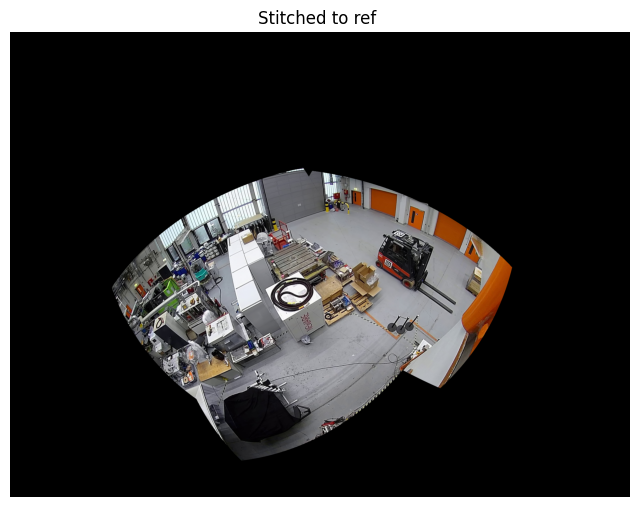

Running SIFT + Kabsch rotation refinement...


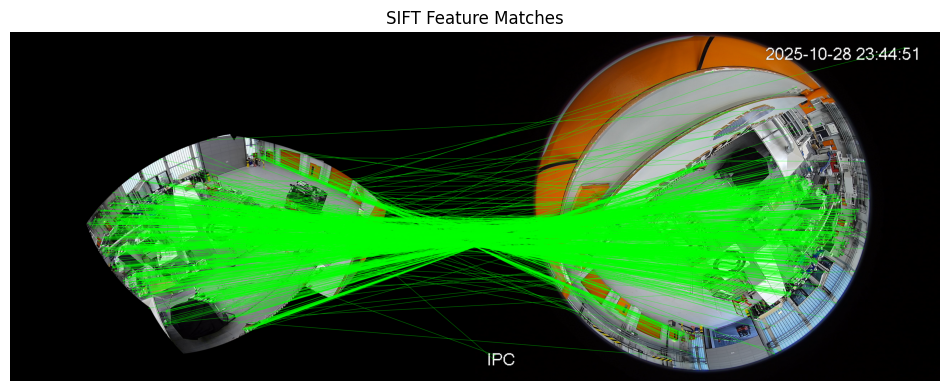

Mean angular error (deg): 5.754
 Wraping View 0
 Wraping View 1
 Wraping View 2
 Wraping View 3


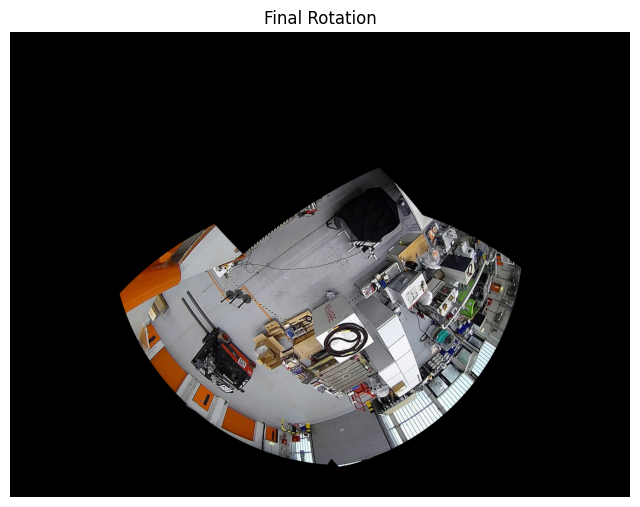

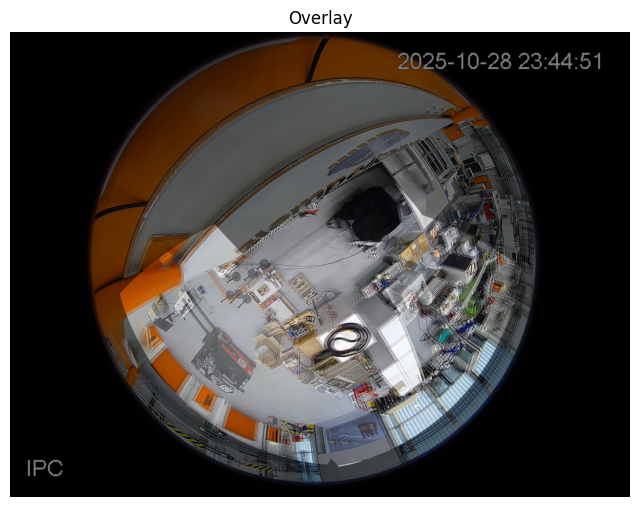

In [19]:

fisheye_params = {
    "width": 2592,
    "height": 1944,
    "cx": 1296.0,
    "cy": 972.0,
    "radius": 952.56,
    "theta_max_rad": 1.5708
}

RECT_W, RECT_H = 1280, 720
VIEW_FOV = 90.0

def build_K_rect_from_view(Wr=1280, Hr=720, fov_deg=90.0, cx=None, cy=None):
    if cx is None: cx = Wr/2.0
    if cy is None: cy = Hr/2.0
    f = (Wr/2.0) / np.tan(np.deg2rad(fov_deg/2.0))
    return np.array([[f,0,cx],[0,f,cy],[0,0,1]], dtype=np.float64)

def build_K_fisheye_from_params(fish_params):
    f_fish = fish_params["radius"] / fish_params["theta_max_rad"]
    return np.array([[f_fish,0,fish_params["cx"]],[0,f_fish,fish_params["cy"]],[0,0,1]], dtype=np.float64)

K_rect = build_K_rect_from_view(RECT_W, RECT_H, VIEW_FOV)
K_fisheye = build_K_fisheye_from_params(fisheye_params)
D_fisheye = np.zeros(4, dtype=np.float64)

def normalize(v):
    n = np.linalg.norm(v, axis=-1, keepdims=True)
    n[n==0] = 1.0
    return v / n

def rectilinear_to_ray(px, K=K_rect):
    px = np.asarray(px, np.float64).reshape(-1,2)
    fx, fy = K[0,0], K[1,1]; cx, cy = K[0,2], K[1,2]
    x = (px[:,0] - cx) / fx
    y = (px[:,1] - cy) / fy
    v = np.stack([x,y,np.ones_like(x)], axis=-1)
    return normalize(v)

def fisheye_project_ray(ray, K=K_fisheye, D=D_fisheye):
    pts = np.asarray(ray, np.float64).reshape(-1,1,3)
    rvec = np.zeros(3); tvec = np.zeros(3)
    imgpts, _ = cv2.fisheye.projectPoints(pts, rvec, tvec, K, D)
    return imgpts.reshape(-1,2)

def ransac_filter_rotation(mk0, mk1, K_rect, max_iter=200, sample_size=50, ang_thresh_deg=1.0):
    mk0, mk1 = np.asarray(mk0, np.float64), np.asarray(mk1, np.float64)
    n = len(mk0)
    if n < 3:
        return np.zeros(n, dtype=bool)
    r0_all = rectilinear_to_ray(mk0, K_rect)
    r1_all = rectilinear_to_ray(mk1, K_rect)
    idxs = np.arange(n)
    best_inliers = []
    ang_thresh = np.deg2rad(ang_thresh_deg)
    for _ in range(max_iter):
        samp = np.random.choice(idxs, min(sample_size,n), replace=False)
        try:
            H = r0_all[samp].T @ r1_all[samp]
            U,_,Vt = np.linalg.svd(H)
            Rm = Vt.T @ U.T
            if np.linalg.det(Rm) < 0:
                Vt[-1,:] *= -1
                Rm = Vt.T @ U.T
        except Exception:
            continue
        r0_rot = (Rm @ r0_all.T).T
        cosang = np.clip(np.sum(r0_rot * r1_all, axis=1), -1, 1)
        ang = np.arccos(cosang)
        inliers = np.where(ang < ang_thresh)[0]
        if len(inliers) > len(best_inliers):
            best_inliers = inliers
        if len(best_inliers) > 0.95 * n:
            break
    mask = np.zeros(n, dtype=bool)
    if len(best_inliers) > 0:
        mask[best_inliers] = True
    return mask


pairs = []
for (i,j), v in matches_dict.items():
    mk0, mk1 = np.asarray(v[0], np.float64), np.asarray(v[1], np.float64)
    if len(mk0) < 6: continue
    mask = ransac_filter_rotation(mk0, mk1, K_rect)
    mk0_in, mk1_in = mk0[mask], mk1[mask]
    if len(mk0_in) < 6: continue
    pairs.append((i,j,mk0_in, mk1_in))
print(f" retained {len(pairs)} pairwise inliers")

n_crops = len(image_rgb)
def choose_ref(matches):
    counts = {}
    for (i,j), v in matches.items():
        counts[i] = counts.get(i,0) + len(v[0])
        counts[j] = counts.get(j,0) + len(v[1])
    return max(counts, key=counts.get) if counts else 0

REF_IDX = choose_ref(matches_dict)
print("REF_IDX =", REF_IDX)

camera_indices = [i for i in range(n_crops) if i != REF_IDX]
def pack_rotvecs(rot_dict):
    return np.hstack([rot_dict[i] for i in camera_indices]) if camera_indices else np.array([])

def unpack_rotvecs(x):
    rotvecs = {i: np.zeros(3, dtype=np.float64) for i in range(n_crops)}
    if x.size == 0: return rotvecs
    idx = 0
    for i in camera_indices:
        rotvecs[i] = x[idx:idx+3].copy()
        idx += 3
    return rotvecs

rotvecs_init = {i: np.zeros(3, dtype=np.float64) for i in range(n_crops)}
x0 = pack_rotvecs(rotvecs_init)

def compute_angular_error(rotvecs_dict):
    angs = []
    for (i,j,mk0,mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else Rot.from_rotvec(rotvecs_dict[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else Rot.from_rotvec(rotvecs_dict[j]).as_matrix()
        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)
        rw0 = r0 @ R0.T
        rw1 = r1 @ R1.T
        cosang = np.clip(np.sum(rw0 * rw1, axis=1), -1, 1)
        angs.extend(np.degrees(np.arccos(cosang)))
    return np.array(angs)

def residuals_ray_BA(x):
    rotvecs = unpack_rotvecs(x)
    parts = []
    for (i,j,mk0,mk1) in pairs:
        R0 = np.eye(3) if i == REF_IDX else Rot.from_rotvec(rotvecs[i]).as_matrix()
        R1 = np.eye(3) if j == REF_IDX else Rot.from_rotvec(rotvecs[j]).as_matrix()
        r0 = rectilinear_to_ray(mk0, K_rect)
        r1 = rectilinear_to_ray(mk1, K_rect)
        rw0 = r0 @ R0.T
        rw1 = r1 @ R1.T
        n = max(1.0, r0.shape[0])
        parts.append((np.cross(rw0, rw1) / np.sqrt(n)).ravel())
    return np.hstack(parts) if parts else np.array([])

print("Running Ray-BA ...")
t0 = time.time()
res = least_squares(residuals_ray_BA, x0, loss='soft_l1', f_scale=0.8,
                    ftol=1e-12, xtol=1e-12, max_nfev=400, verbose=2)
x_opt = res.x
rotvecs_opt = unpack_rotvecs(x_opt)
print(f"Ray-BA took {time.time()-t0:.2f}s")

ang_errs_pix = compute_angular_error(rotvecs_opt)
print("Mean angular error (deg):", np.nanmean(ang_errs_pix))

R_list = []
for i in range(n_crops):
    R_opt = np.eye(3) if i == REF_IDX else Rot.from_rotvec(rotvecs_opt[i]).as_matrix()
    R_list.append(R_opt)
R_ref_est = np.eye(3)

R_flipY = np.diag([1, -1, 1])
R_ref_corrected = R_flipY @  np.eye(3)
R_list_global = [R_ref_corrected @ R_i for R_i in R_list]



def stitch_textures_reference(R_list_in, views_rgb, fisheye_params, Wr=RECT_W, Hr=RECT_H):
    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    fisheye_canvas = np.zeros((Hf, Wf, 3), dtype=np.float32)
    weight_mask = np.zeros((Hf, Wf, 1), dtype=np.float32)

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)
    ray_global = np.dstack((sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)))

    f = (Wr / 2.0) / np.tan(np.deg2rad(VIEW_FOV / 2.0))
    cx_r, cy_r = Wr/2.0, Hr/2.0

    for idx, (R_cam, rect_img) in enumerate(zip(R_list_in, views_rgb)):
        print(f" Wraping View {idx}")
        ray_local = ray_global @ R_cam
        Xc, Yc, Zc = ray_local[...,0], ray_local[...,1], ray_local[...,2]
        u = f * (Xc / (Zc + 1e-12)) + cx_r
        v = f * (Yc / (Zc + 1e-12)) + cy_r
        valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)
        map_x, map_y = u.astype(np.float32), v.astype(np.float32)
        warped = cv2.remap((rect_img*255).astype(np.uint8), map_x, map_y,
                           interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
        warped = warped.astype(np.float32) / 255.0
        mask = valid.astype(np.float32)[...,None]
        fisheye_canvas += warped * mask
        weight_mask += mask

    weight_mask[weight_mask == 0] = 1.0
    stitched = fisheye_canvas / weight_mask
    circle_mask = ((xs - cx_f)**2 + (ys - cy_f)**2) <= radius**2
    stitched[~circle_mask] = 0.0
    return stitched

views = [cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)/255.0 for p in views_path]
stitched_geom = stitch_textures_reference(R_list_global, views, fisheye_params)
plt.figure(figsize=(8,8))
plt.imshow(np.clip(stitched_geom,0,1))
plt.title("Stitched to ref ")
plt.axis("off")
plt.show()



# KABSCH 

def kabsch_refine_rotation(stitched_img, fisheye_img, fisheye_params, min_matches=8, show_matches=True):
    print("Running SIFT + Kabsch rotation refinement...")
    gray1 = cv2.cvtColor((stitched_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor((fisheye_img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    if des1 is None or des2 is None or len(kp1) < min_matches or len(kp2) < min_matches:
        return np.eye(3)


    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good = [m for m, n in matches if m.distance < 0.75 * n.distance]
    if len(good) < min_matches:
        return np.eye(3)

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

    if show_matches:
        matched_vis = cv2.drawMatches(
            (stitched_img*255).astype(np.uint8), kp1,
            (fisheye_img*255).astype(np.uint8), kp2,
            good, None, matchColor=(0, 255, 0), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        plt.figure(figsize=(12, 8))
        plt.imshow(matched_vis)
        plt.title("SIFT Feature Matches")
        plt.axis("off")
        plt.show()
    cx, cy, radius, theta_max = (fisheye_params["cx"], fisheye_params["cy"],
                                 fisheye_params["radius"], fisheye_params["theta_max_rad"])

    def pix2ray(pts):
        dx, dy = pts[:, 0] - cx, cy - pts[:, 1]
        r = np.sqrt(dx**2 + dy**2)
        theta = (r / radius) * theta_max
        phi = np.arctan2(dy, dx)
        sin_t = np.sin(theta)
        return np.stack([sin_t * np.cos(phi), sin_t * np.sin(phi), np.cos(theta)], axis=-1)

    rays1, rays2 = pix2ray(pts1), pix2ray(pts2)
    mu1, mu2 = rays1.mean(axis=0), rays2.mean(axis=0)
    X, Y = rays1 - mu1, rays2 - mu2
    H = X.T @ Y
    U, S, Vt = np.linalg.svd(H)
    R_best = Vt.T @ U.T
    if np.linalg.det(R_best) < 0:
        Vt[-1, :] *= -1
        R_best = Vt.T @ U.T

    err = np.degrees(np.arccos(np.clip(np.sum((rays1 @ R_best.T) * rays2, axis=1), -1, 1)))
    print(f"Mean angular error (deg): {np.nanmean(err):.3f}")
    return R_best


if fisheye_img is not None:
    R_corr = kabsch_refine_rotation(stitched_geom, fisheye_img, fisheye_params)
    R_ref_corrected = R_corr @ R_ref_corrected
    R_list_global = [R_ref_corrected @ R_i for R_i in R_list]
    stitched_corrected = stitch_textures_reference(R_list_global, views, fisheye_params)
    overlay = 0.5 * stitched_corrected + 0.5 * fisheye_img
    plt.figure(figsize=(8,8))
    plt.imshow(stitched_corrected)
    plt.title("Final Rotation")
    plt.axis("off")
    plt.figure(figsize=(8,8))
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")
    plt.show()



In [10]:
R_list

[array([[ 0.66872874,  0.49789067, -0.55218362],
        [-0.55246052,  0.82977511,  0.07912414],
        [ 0.4975834 ,  0.25214707,  0.82995941]]),
 array([[ 0.77669504, -0.43773996,  0.45291118],
        [ 0.4687946 ,  0.88197482,  0.04849777],
        [-0.42068567,  0.17465434,  0.8902356 ]]),
 array([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]]),
 array([[ 0.80914263,  0.5819189 , -0.08160022],
        [-0.43649774,  0.68820264,  0.57952295],
        [ 0.39339284, -0.43329841,  0.81086038]])]

In [11]:
R_list_global

[array([[-0.67775756, -0.50563272,  0.53383549],
        [-0.73518822,  0.45420174, -0.50318892],
        [-0.01195983,  0.73350965,  0.67957384]]),
 array([[-0.76874573,  0.43130302, -0.472237  ],
        [ 0.63942338,  0.53327583, -0.55385437],
        [-0.01295349,  0.72773257,  0.68573869]]),
 array([[-0.99976099, -0.00288788, -0.02167293],
        [ 0.01235399,  0.74323338, -0.66891819],
        [-0.01803982,  0.66902608,  0.74302   ]]),
 array([[-0.81621466, -0.57437641,  0.0623334 ],
        [-0.57757118,  0.80852539, -0.11268655],
        [-0.0143264 ,  0.12797842,  0.9916735 ]])]

View 1: Photometric Mean (Total): 7.05px | Mean geometric pixel displacement: 0.000033 px
First 5 original rect points:
[[ 40   0]
 [ 80   0]
 [120   0]
 [160   0]
 [200   0]]
First 5 reprojected rect points:
[[3.99999831e+01 2.05554771e-05]
 [7.99999803e+01 1.82801314e-05]
 [1.19999978e+02 1.59801473e-05]
 [1.59999975e+02 1.36534615e-05]
 [1.99999973e+02 1.12982532e-05]]


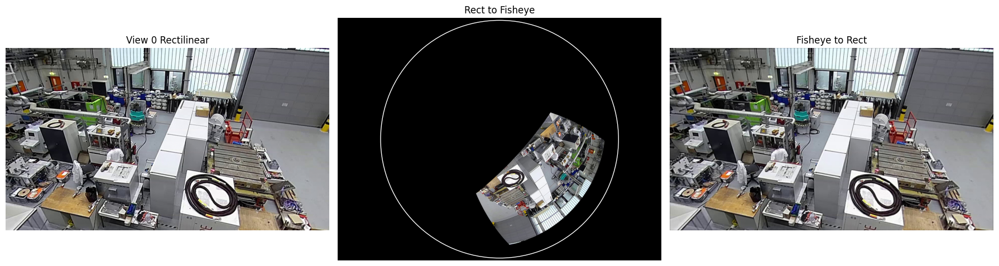

View 2: Photometric Mean (Total): 4.53px | Mean geometric pixel displacement: 0.000030 px
First 5 original rect points:
[[ 40  40]
 [ 80  40]
 [120  40]
 [160  40]
 [200  40]]
First 5 reprojected rect points:
[[ 39.99997644  39.99995168]
 [ 79.99998087  39.99995223]
 [119.99998512  39.99995279]
 [159.99998921  39.99995338]
 [199.99999313  39.99995399]]


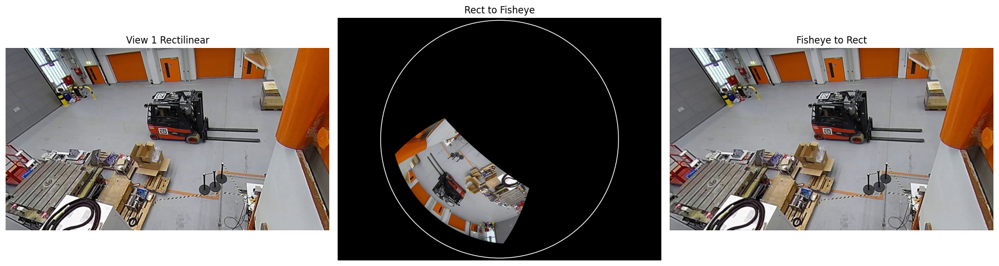

View 3: Photometric Mean (Total): 5.71px | Mean geometric pixel displacement: 0.000040 px
First 5 original rect points:
[[ 40  40]
 [ 80  40]
 [120  40]
 [160  40]
 [200  40]]
First 5 reprojected rect points:
[[ 39.99994359  39.99998794]
 [ 79.99994712  39.9999866 ]
 [119.99995071  39.99998524]
 [159.99995436  39.99998388]
 [199.99995807  39.9999825 ]]


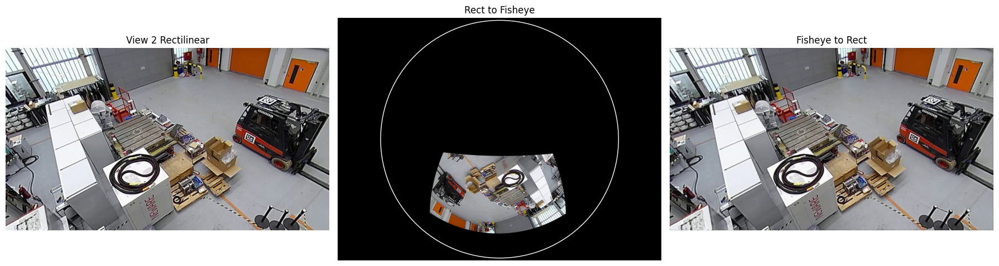

View 4: Photometric Mean (Total): 4.97px | Mean geometric pixel displacement: 0.000048 px
First 5 original rect points:
[[ 40   0]
 [ 80   0]
 [120   0]
 [160   0]
 [200   0]]
First 5 reprojected rect points:
[[3.99999913e+01 4.64178569e-05]
 [7.99999875e+01 4.58245595e-05]
 [1.19999984e+02 4.51303895e-05]
 [1.59999980e+02 4.43081963e-05]
 [1.99999977e+02 4.33255877e-05]]


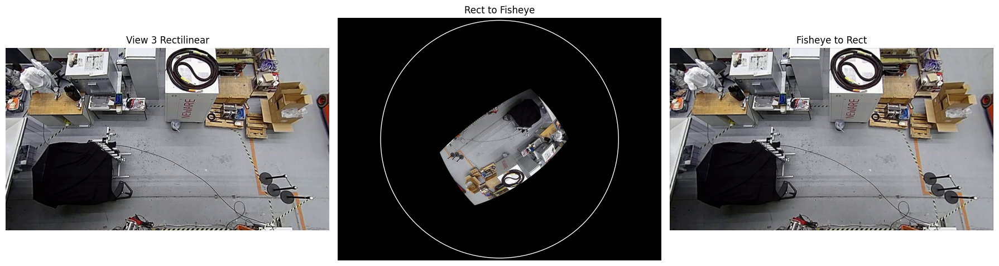

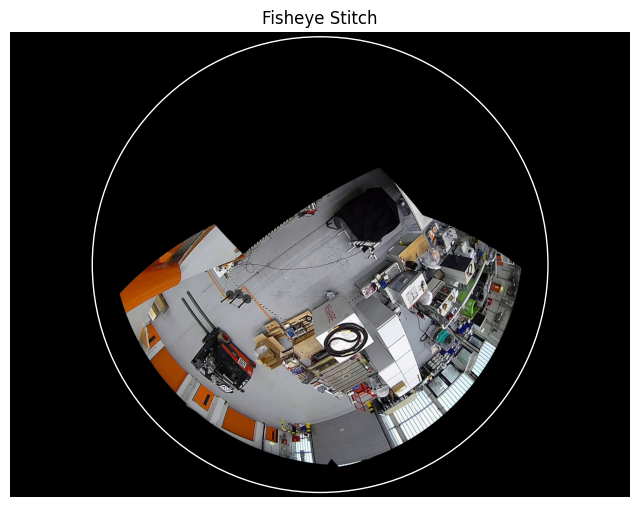

In [21]:
def project_rect_to_fisheye(rect_img, R_cam, raw_fisheye_img, fisheye_params, Wr=1280, Hr=720, fov_deg=90.0):

    Hf, Wf = fisheye_params["height"], fisheye_params["width"]
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    xs, ys = np.meshgrid(np.arange(Wf), np.arange(Hf))
    dx, dy = xs - cx_f, cy_f - ys   
    r = np.sqrt(dx**2 + dy**2)
    theta = (r / radius) * theta_max
    phi = np.arctan2(dy, dx)
    sin_t = np.sin(theta)

    ray_global = np.dstack([
        sin_t * np.cos(phi),
        sin_t * np.sin(phi),
        np.cos(theta)
    ])  

    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    ray_rect = ray_global @ R_cam
    Xc, Yc, Zc = ray_rect[..., 0], ray_rect[..., 1], ray_rect[..., 2]
    u = f * (Xc / (Zc + 1e-12)) + cx_r
    v = f * (Yc / (Zc + 1e-12)) + cy_r
    valid = (u >= 0) & (u < Wr) & (v >= 0) & (v < Hr) & (r <= radius) & (Zc > 0)

    warped = cv2.remap(
        (rect_img * 255).astype(np.uint8),
        u.astype(np.float32), v.astype(np.float32),
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT
    ).astype(np.float32) / 255.0

    circle_mask = (dx**2 + dy**2) <= radius**2
    warped[~circle_mask] = 0.0
    valid &= circle_mask
    fisheye_patch = np.zeros_like(warped)
    fisheye_patch[valid] = raw_fisheye_img[valid]

    return warped, fisheye_patch, valid


def project_fisheye_to_rect(fish_img, R_cam, fisheye_params, Wr=1280, Hr=720, fov_deg=90.0):

    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]
    xs, ys = np.meshgrid(np.arange(Wr), np.arange(Hr))
    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    x = (xs - cx_r) / f
    y = (ys - cy_r) / f
    ray_rect = np.dstack((x, y, np.ones_like(x)))
    ray_rect /= np.linalg.norm(ray_rect, axis=-1, keepdims=True)
    ray_global = ray_rect @ R_cam.T

    X, Y, Z = ray_global[..., 0], ray_global[..., 1], ray_global[..., 2]

    theta = np.arccos(np.clip(Z, -1, 1))
    phi = np.arctan2(Y, X)
    r = (theta / theta_max) * radius
    u = fisheye_params["cx"] + r * np.cos(phi)
    v = fisheye_params["cy"] - r * np.sin(phi)

    valid = (r <= radius) & (Z > 0)

    rect_back = cv2.remap(
        (fish_img * 255).astype(np.uint8),
        u.astype(np.float32), v.astype(np.float32),
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT
    ).astype(np.float32) / 255.0

    return rect_back, valid


def compute_geometric_pixel_displacement(R_cam, fisheye_params, Wr=1280, Hr=720, fov_deg=90.0, step=40):

    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    ys, xs = np.mgrid[0:Hr:step, 0:Wr:step]
    coords = np.stack([xs.ravel(), ys.ravel()], axis=-1)

    x = (coords[:, 0] - cx_r) / f
    y = (coords[:, 1] - cy_r) / f
    z = np.ones_like(x)
    ray_rect = np.stack([x, y, z], axis=1)
    ray_rect /= np.linalg.norm(ray_rect, axis=1, keepdims=True)
    ray_fish = ray_rect @ R_cam.T
    Xf, Yf, Zf = ray_fish[:, 0], ray_fish[:, 1], ray_fish[:, 2]
    theta = np.arccos(np.clip(Zf, -1, 1))
    phi = np.arctan2(Yf, Xf)
    r = (theta / theta_max) * radius

    sin_t = np.sin(theta)
    ray_back_fish = np.stack([sin_t * np.cos(phi),
                              sin_t * np.sin(phi),
                              np.cos(theta)], axis=1)

    ray_back_rect = ray_back_fish @ R_cam
    Xb, Yb, Zb = ray_back_rect[:, 0], ray_back_rect[:, 1], ray_back_rect[:, 2]
    u_back = f * (Xb / (Zb + 1e-12)) + cx_r
    v_back = f * (Yb / (Zb + 1e-12)) + cy_r

    valid = (Zb > 0) & (u_back >= 0) & (u_back < Wr) & (v_back >= 0) & (v_back < Hr)
    coords_valid = coords[valid]
    u_back_valid, v_back_valid = u_back[valid], v_back[valid]

    disp = np.sqrt((coords_valid[:, 0] - u_back_valid)**2 + (coords_valid[:, 1] - v_back_valid)**2)
    mean_disp = np.mean(disp) if disp.size > 0 else 0.0

    return coords_valid, np.stack([u_back_valid, v_back_valid], axis=1), mean_disp



for i, (rect_img, R_cam) in enumerate(zip(views, R_list_global)):
    fish_wrap, fisheye_region, valid = project_rect_to_fisheye(rect_img, R_cam, fisheye_img, fisheye_params)
    rect_back, valid_back = project_fisheye_to_rect(fish_wrap, R_cam, fisheye_params)

    coords_orig, coords_back, mean_disp = compute_geometric_pixel_displacement(
        R_cam, fisheye_params, Wr=RECT_W, Hr=RECT_H, fov_deg=VIEW_FOV
    )


    diff = np.linalg.norm((rect_img - rect_back), axis=2)
    valid_mask = valid_back > 0
    diff_valid = diff[valid_mask]
    photo_mean = np.mean(diff_valid) * 255.0 if diff_valid.size > 0 else np.nan

    print(f"View {i+1}: Photometric Mean (Total): {photo_mean:.2f}px | Mean geometric pixel displacement: {mean_disp:.6f} px")
    print("First 5 original rect points:")
    print(coords_orig[:5])
    print("First 5 reprojected rect points:")
    print(coords_back[:5])

    # Visualization
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(rect_img)
    plt.title(f"View {i} Rectilinear")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                      fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
    plt.gca().add_patch(circ)
    plt.imshow(fish_wrap)
    plt.title("Rect to Fisheye")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(rect_back)
    plt.title("Fisheye to Rect")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


plt.figure(figsize=(8,8))
plt.imshow(stitched_corrected)
circ = plt.Circle((fisheye_params["cx"], fisheye_params["cy"]),
                  fisheye_params["radius"], color=(1,1,1), fill=False, linewidth=1)
plt.gca().add_patch(circ)
plt.title("Fisheye Stitch")
plt.axis("off")
plt.show()


In [29]:
FISH_W_DISP, FISH_H_DISP = 1280, 720
RECT_TILE_W_DISP, RECT_TILE_H_DISP = 640, 360

RECT_W, RECT_H = 1280, 720
VIEW_FOV = 90.0

cam_settings = [R for R in R_list_global]

fisheye_display = cv2.resize(fisheye_img_, (FISH_W_DISP, FISH_H_DISP))
views_disp = [cv2.resize(v, (RECT_TILE_W_DISP, RECT_TILE_H_DISP)) for v in image_bgr]

scale_fx = fisheye_params["width"] / FISH_W_DISP
scale_fy = fisheye_params["height"] / FISH_H_DISP

def rect_to_fisheye_point(u_r, v_r, cam, fisheye_params, Wr=RECT_W, Hr=RECT_H, fov_deg=VIEW_FOV):
    R_cam = cam
    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    x, y = (u_r - cx_r) / f, (v_r - cy_r) / f
    ray_rect = np.array([x, y, 1.0])
    ray_rect /= np.linalg.norm(ray_rect)

    ray_global = ray_rect @ R_cam.T
    Xg, Yg, Zg = ray_global
    theta, phi = np.arccos(np.clip(Zg, -1.0, 1.0)), np.arctan2(Yg, Xg)

    r = (theta / fisheye_params["theta_max_rad"]) * fisheye_params["radius"]
    if r > fisheye_params["radius"]:
        return None
    u_f = fisheye_params["cx"] + r * np.cos(phi)
    v_f = fisheye_params["cy"] - r * np.sin(phi)
    if not (0 <= u_f < fisheye_params["width"] and 0 <= v_f < fisheye_params["height"]):
        return None
    return (u_f, v_f)


def fisheye_to_rect_point(u_f, v_f, cam, fisheye_params, Wr=RECT_W, Hr=RECT_H, fov_deg=VIEW_FOV):
    R_cam = cam
    cx_f, cy_f = fisheye_params["cx"], fisheye_params["cy"]
    radius, theta_max = fisheye_params["radius"], fisheye_params["theta_max_rad"]

    dx, dy = u_f - cx_f, cy_f - v_f
    r = np.sqrt(dx**2 + dy**2)
    if r > radius:
        return None
    theta, phi = (r / radius) * theta_max, np.arctan2(dy, dx)
    sin_t = np.sin(theta)

    ray_global = np.array([
        sin_t * np.cos(phi),
        sin_t * np.sin(phi),
        np.cos(theta)
    ])

    ray_rect = ray_global @ R_cam
    Xc, Yc, Zc = ray_rect
    if Zc <= 1e-9:
        return None

    f = (Wr / 2.0) / np.tan(np.deg2rad(fov_deg / 2.0))
    cx_r, cy_r = Wr / 2.0, Hr / 2.0
    u_rect = f * (Xc / Zc) + cx_r
    v_rect = f * (Yc / Zc) + cy_r
    if not (0 <= u_rect < Wr and 0 <= v_rect < Hr):
        return None
    return (u_rect, v_rect)

def make_rect_grid_disp():
    grid = np.ones((RECT_TILE_H_DISP * 2, RECT_TILE_W_DISP * 2, 3), dtype=np.uint8) * 30
    grid[0:RECT_TILE_H_DISP, 0:RECT_TILE_W_DISP] = views_disp[0]
    grid[0:RECT_TILE_H_DISP, RECT_TILE_W_DISP:] = views_disp[1]
    grid[RECT_TILE_H_DISP:, 0:RECT_TILE_W_DISP] = views_disp[2]
    grid[RECT_TILE_H_DISP:, RECT_TILE_W_DISP:] = views_disp[3]
    return grid

rect_grid_disp = make_rect_grid_disp()


def draw_text(img, text, pos, color=(255, 255, 255)):
    font = cv2.FONT_HERSHEY_COMPLEX
    scale = 0.8
    thickness = 2
    x, y = int(pos[0]), int(pos[1])
    cv2.putText(img, text, (x + 1, y + 1), font, scale, (0, 0, 0), thickness, cv2.LINE_AA)
    cv2.putText(img, text, (x, y), font, scale, color, thickness, cv2.LINE_AA)


def on_mouse(event, x, y, flags, param):
    global canvas
    if event != cv2.EVENT_LBUTTONDOWN:
        return

    fisheye_disp = fisheye_display.copy()
    rect_disp = rect_grid_disp.copy()

    if x < FISH_W_DISP: 
        u_full, v_full = x * scale_fx, y * scale_fy
        cv2.circle(fisheye_disp, (x, y), 3, (0, 255, 0), -1)
        draw_text(fisheye_disp, f"({u_full:.1f},{v_full:.1f})", (x, y), (0, 255, 0))
        print(f"Click Fisheye_point=({u_full:.1f},{v_full:.1f})")

        for i, cam in enumerate(cam_settings):
            pt = fisheye_to_rect_point(u_full, v_full, cam, fisheye_params)
            if pt is not None:
                u_rect, v_rect = pt
                ox, oy = (i % 2) * RECT_TILE_W_DISP, (i // 2) * RECT_TILE_H_DISP
                u_disp, v_disp = int(u_rect / 2), int(v_rect / 2)
                pos = (ox + u_disp, oy + v_disp)
                cv2.circle(rect_disp, pos, 3, (0, 0, 255), -1)
                draw_text(rect_disp, f"({u_rect:.0f},{v_rect:.0f})", pos, (0, 0, 255))
                print(f" Rect view {i+1}: Rect_point=({u_rect:.1f},{v_rect:.1f}) ")

    else:  
        xr = x - FISH_W_DISP
        xi, yi = xr % RECT_TILE_W_DISP, y % RECT_TILE_H_DISP
        view_idx = (y >= RECT_TILE_H_DISP) * 2 + (xr >= RECT_TILE_W_DISP)
        u_full, v_full = xi * 2, yi * 2
        pt_f = rect_to_fisheye_point(u_full, v_full, cam_settings[view_idx], fisheye_params)
        print(f"Click Rect_point=({u_full},{v_full}) ")
        if pt_f is not None:
            u_f, v_f = pt_f
            u_fd, v_fd = int(u_f / scale_fx), int(v_f / scale_fy)
            cv2.circle(fisheye_disp, (u_fd, v_fd), 3, (0, 0,255), -1)
            draw_text(fisheye_disp, f"({int(u_f)},{int(v_f)})", (u_fd, v_fd), (0, 0, 255))
            print(f" Fisheye_point=({int(u_f)},{int(v_f)})")

        cv2.circle(rect_disp, (x - FISH_W_DISP, y), 3, (0, 255, 0), -1)
        draw_text(rect_disp, f"({u_full},{v_full})", (x - FISH_W_DISP, y), (0, 255, 0))


    canvas = np.ones((max(FISH_H_DISP, rect_disp.shape[0]),
                      FISH_W_DISP + rect_disp.shape[1], 3), dtype=np.uint8) * 255
    canvas[0:FISH_H_DISP, 0:FISH_W_DISP] = fisheye_disp
    canvas[0:rect_disp.shape[0], FISH_W_DISP:] = rect_disp
    cv2.imshow("Unified Mapping", canvas)



canvas = np.ones((720, 2560, 3), dtype=np.uint8) * 255
canvas[0:720, 0:1280] = fisheye_display
canvas[0:720, 1280:] = rect_grid_disp

cv2.namedWindow("Unified Mapping", cv2.WINDOW_NORMAL)
cv2.setMouseCallback("Unified Mapping", on_mouse)
cv2.imshow("Unified Mapping", canvas)

while True:
    if cv2.waitKey(20) & 0xFF == 27:
        break

cv2.destroyAllWindows()


Click Fisheye_point=(1381.0,1309.5)
 Rect view 1: Rect_point=(842.7,578.7) 
 Rect view 2: Rect_point=(282.5,668.2) 
 Rect view 3: Rect_point=(538.5,471.9) 
 Rect view 4: Rect_point=(770.6,79.6) 
Click Rect_point=(660,408) 
 Fisheye_point=(1611,1299)
Click Fisheye_point=(1097.5,1082.7)
 Rect view 2: Rect_point=(726.3,680.3) 
 Rect view 4: Rect_point=(883.1,469.9) 
Click Fisheye_point=(919.3,1120.5)
 Rect view 2: Rect_point=(836.5,498.0) 
 Rect view 3: Rect_point=(1118.3,666.6) 
 Rect view 4: Rect_point=(1131.4,566.3) 
Click Rect_point=(912,286) 
 Fisheye_point=(1496,1544)
Click Fisheye_point=(1504.6,1547.1)
 Rect view 1: Rect_point=(907.4,278.8) 
 Rect view 3: Rect_point=(426.2,196.5) 
Click Fisheye_point=(917.3,1117.8)
 Rect view 2: Rect_point=(840.2,498.5) 
 Rect view 3: Rect_point=(1123.0,670.2) 
 Rect view 4: Rect_point=(1132.4,570.9) 
Click Rect_point=(1158,362) 
 Fisheye_point=(1286,1591)
Click Rect_point=(912,288) 
 Fisheye_point=(1495,1543)
Click Rect_point=(1272,322) 
 Fisheye_